In [191]:
import numpy as np
import pandas as pd
import torch
from torch import nn
from collections import OrderedDict
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
# Extras needed
import time
import math
from utils import *

In [192]:
# Modify `generate_train_test_split` to return separate data and labels for DataLoader usage
def generate_train_test_split(count: int, dim: int, n: int, device: torch.device, coord_max: float, test_size: float = 0.2, seed: int = 42):
    all_batches = generate_vector_batches(count, dim, n, device, coord_max, seed)
    labels = torch.arange(count)  # Placeholder labels if needed

    train_indices, test_indices = train_test_split(range(count), test_size=test_size, random_state=seed)
    train_batches, test_batches = all_batches[train_indices], all_batches[test_indices]

    return train_batches, test_batches


In [193]:
class Base_Wasser_NN(nn.Module):
    def __init__(self, n: int, d: int):
        super().__init__()
        self.n = n
        self.d = d
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(OrderedDict([
            ('Lin1', nn.Linear(2 * n * d, 4 * n * d)),
            ('relu1', nn.ReLU()),
            ('Lin2', nn.Linear(4 * n * d, n * n + 2 * n))  # n x n matrix and two n-long vectors
        ]))

    def forward(self, batch):
        # Reshape batch to (batch_size, 2 * n * d) for the Linear layer
        batch_size = batch.size(0)
        flattened_batch = batch.view(batch_size, 2 * self.n * self.d)  # (batch_size, 2 * n * d)
        
        # Pass through the sequential layers
        logits = self.linear_relu_stack(flattened_batch)
        return logits
    def predict_interval(self, batch):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        # Forward pass to get predictions
        pred = self.forward(batch)  # Now expects batched output of shape (batch_size, n * n + 2 * n)
        batch_size = pred.size(0)
        
        results = []
        for i in range(batch_size):
            # Compute distance matrix for the i-th element in the batch
            distances_mat = torch.cdist(vecs1[i], vecs2[i], p=2)  # Shape: (n, n)
    
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            out_put_mat = single_pred[:n * n].view(n, n)  # Shape: (n, n)
            f = single_pred[n * n:n * n + n]              # Shape: (n,)
            g = single_pred[n * n + n:]                   # Shape: (n,)
    
            # Compute primal and dual solutions
            sol_prim = primal_sol(out_put_mat=out_put_mat, distances_mat=distances_mat)
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)
            
            # Append the result (sol_prim, sol_dual) for each batch element
            results.append((sol_prim, sol_dual))
        
        return results  # Returns a list of tuples, each containing (sol_prim, sol_dual) for a batch element


In [194]:
def make_wass_loss(n: int, d: int):
    def wass_loss(batch, pred):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        batch_size = pred.size(0)  # Determine batch size from pred

        # Compute distance matrix for each item in the batch
        total_loss = 0
        for i in range(batch_size):
            distances_mat = torch.cdist(vecs1[i], vecs2[i])  # Shape: (n, n)
            
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            out_put_mat = single_pred[:n * n].view(n, n)  # Shape: (n, n)
            f = single_pred[n * n:n * n + n]              # Shape: (n,)
            g = single_pred[n * n + n:]                   # Shape: (n,)
            
            # Compute primal and dual solutions for each item in the batch
            sol_prim = primal_sol(out_put_mat=out_put_mat, distances_mat=distances_mat)
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)

            # Check for NaNs in solutions
            if torch.isnan(sol_prim).any():
                print(f"NaN detected in sol_prim {i}")
            if torch.isnan(sol_dual).any():
                print(f"NaN detected in sol_dual {i}")

            # Accumulate loss
            total_loss += torch.abs(sol_prim - sol_dual)

        # Return average loss across the batch
        return total_loss / batch_size if batch_size > 0 else torch.tensor(0.0, device=pred.device)

    return wass_loss


In [195]:
def train_model(model, dataloader, loss_fn, optimizer,max_norm = 2.0):
    model.train()
    for batch in dataloader:
        batch = batch[0].to(device)  # Extract batch tensor from DataLoader tuple
        optimizer.zero_grad()

        # Forward pass
        logits = model(batch)
        
        # Compute loss
        loss = loss_fn(batch, logits)
        
        # Backward pass and optimization step
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=max_norm)
        optimizer.step()

def test_model(model, dataloader, loss_fn):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for batch in dataloader:
            batch = batch[0].to(device)
            logits = model(batch)
            loss = loss_fn(batch, logits)
            total_loss += loss.item()
    
    avg_loss = total_loss / len(dataloader)
    return avg_loss


In [291]:
def plot_losses(train_losses, test_losses):
    """
    Plots average train and test losses against their indices.
    
    Parameters:
    - train_losses (list or array): List or array of average training losses.
    - test_losses (list or array): List or array of average testing losses.
    """
    # Ensure both arrays are the same length
    if len(train_losses) != len(test_losses):
        raise ValueError("train_losses and test_losses must be of the same length.")
    
    indices = range(len(train_losses))
    
    plt.figure(figsize=(12, 5))
    plt.plot(indices, train_losses, label="Average Train Loss", color='blue', marker='o',markersize = 4)
    plt.plot(indices, test_losses, label="Average Test Loss", color='red', marker='x',markersize = 4)
    
    plt.xlabel("Index")
    plt.ylabel("Loss")
    plt.title("Train vs. Test Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

In [336]:
def plot_model_params(model):
    # Collect all parameter values into a single list
    params = []
    small_params_count = 0  # Counter for parameters with magnitude <= 0.1

    for param in model.parameters():
        param_array = param.detach().cpu().numpy().flatten()
        params.extend(param_array)
        
        # Count parameters with magnitude <= 0.1
        small_params_count += sum(abs(p) <= 0.02 for p in param_array)

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(params, bins=100, color='skyblue', edgecolor='black')
    plt.title('Histogram of Model Parameters')
    plt.xlabel('Parameter values')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    # Print the total number of parameters and the count of small parameters
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total number of trainable parameters: {total_params}")
    print(f"Number of parameters with |value| <= 0.02: {small_params_count}")

## Define Parameters

In [7]:
count = 5000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-2
batch_size = 64  # Define batch size
epochs = 50

## Generating train and test batches

In [8]:
train_batches, test_batches = generate_train_test_split(count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)


In [9]:
# Model, loss, optimizer
model = Base_Wasser_NN(n=n, d=d).to(device)
loss_fn = make_wass_loss(n=n, d=d)
optimizer = torch.optim.SGD(model.parameters(), lr=lr,momentum=0.95,nesterov=True)
avg_test_losses = []
avg_train_losses = []
# Training and testing loop
for t in range(epochs):
    print(f"Epoch {t + 1}\n-------------------------------")
    start_time = time.time()
    # Training
    train_model(model, train_loader, loss_fn, optimizer)
    # Testing
    avg_test_losses.append(test_model(model, test_loader, loss_fn))
    avg_train_losses.append(test_model(model, train_loader, loss_fn))
    print(f"Average Train Loss: {avg_train_losses[-1]:.4f}, Average Test Loss: {avg_test_losses[-1]:.4f}")
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch Run time: {epoch_duration:.2f} seconds.\n")
    print("-------------------------------")

print("Done!")

Epoch 1
-------------------------------
Average Train Loss: 14.7946, Average Test Loss: 15.2986
Epoch Run time: 8.01 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 13.1740, Average Test Loss: 13.6835
Epoch Run time: 8.08 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 12.4624, Average Test Loss: 13.0704
Epoch Run time: 8.06 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 12.0063, Average Test Loss: 12.6376
Epoch Run time: 8.22 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 11.7478, Average Test Loss: 12.3732
Epoch Run time: 8.16 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 11.4854, Average Test Loss: 12.2436
Epoch Run time: 8.12 seconds.

-------------------------------
Epoch 7
-------------------------------
Averag

# Saving and Loading model

In [10]:
model_path = "Trained_models/Basic_net_50_ep_1500_data.pt"

In [11]:
torch.save(model.state_dict(), model_path)

In [12]:
# Loading the model
model = Base_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


# Plotting losses

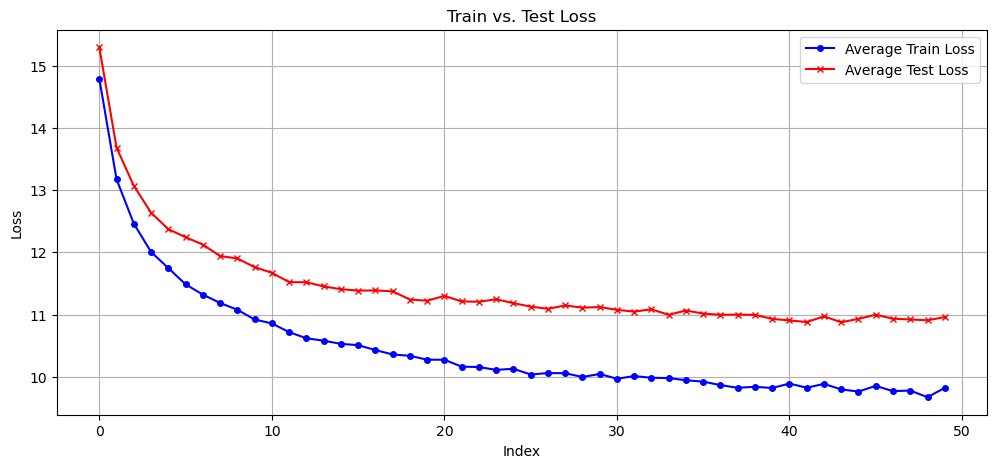

In [13]:
plot_losses(avg_train_losses,avg_test_losses)

# Bounds Visualization

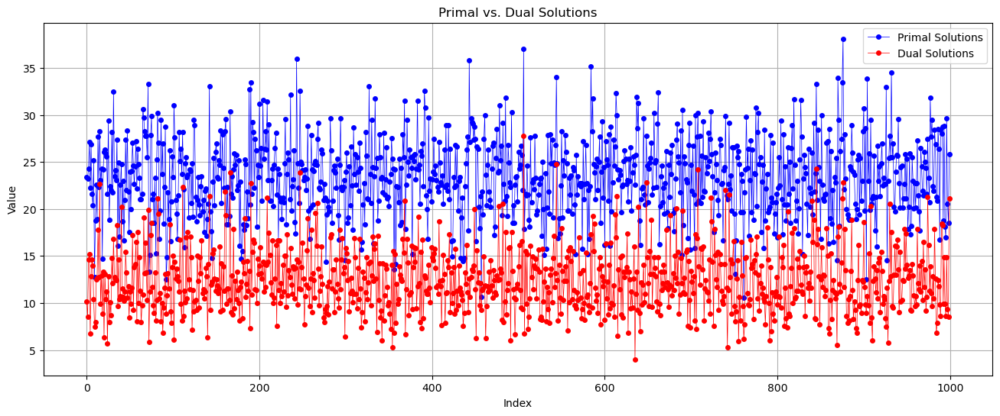

In [14]:
# Set up lists to hold primal and dual solutions
primal_solutions = []
dual_solutions = []
model.eval()  # Set the model to evaluation mode
with torch.no_grad():  # Disable gradient computation for efficiency
    for batch in test_loader:
        sets = batch[0].to(device)

        # Get batched primal and dual solutions
        sets_results = model.predict_interval(sets)
            
        # Separate primal and dual solutions
        for sol_prim, sol_dual in sets_results:
            primal_solutions.append(sol_prim.item())  # Assuming sol_prim is a tensor
            dual_solutions.append(sol_dual.item())    # Assuming sol_dual is a tensor

        # # Since we are breaking after the first batch, we can exit the loop here
        # break  # Remove this line if you want to process more batches

# Convert to numpy arrays for easier plotting
primal_solutions = np.array(primal_solutions)
dual_solutions = np.array(dual_solutions)

# Plotting the results
plt.figure(figsize=(16, 6))

# Plot primal solutions in blue
plt.plot(primal_solutions, label='Primal Solutions', color='blue', marker='o', linestyle='-',linewidth = 0.5,markersize = 4)

# Plot dual solutions in red
plt.plot(dual_solutions, label='Dual Solutions', color='red', marker='o', linestyle='-',linewidth = 0.5,markersize = 4)

plt.title('Primal vs. Dual Solutions')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid(True)
plt.legend()
plt.show()

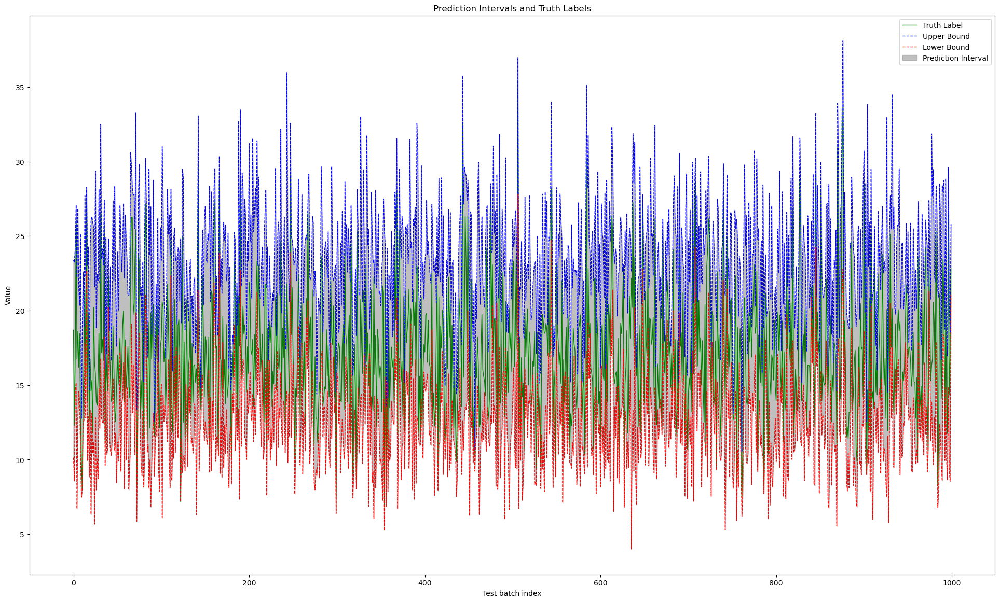

In [15]:
preds = [(dual,primal) for dual,primal in zip(dual_solutions,primal_solutions)]
x = range(len(test_batches))  # x-axis values (can be indices or actual values)
primal_bounds = [pred[1] for pred in preds]
dual_bounds = [pred[0] for pred in preds]
true_label = [wass_hungarian(input).cpu() for input in test_batches]         # True label (ground truth)

# Plotting
plt.figure(figsize=(24, 14))
plt.plot(x, true_label, label='Truth Label', color='green', linewidth=1)
plt.plot(x, primal_bounds, label='Upper Bound', color='blue', linestyle='--', linewidth=1)
plt.plot(x, dual_bounds, label='Lower Bound', color='red', linestyle='--', linewidth=1)

# Shading the area between the lower and upper bounds
plt.fill_between(x, dual_bounds, primal_bounds, color='gray', alpha=0.5, label='Prediction Interval')

# Labels and legend
plt.xlabel('Test batch index')
plt.ylabel('Value')
plt.title('Prediction Intervals and Truth Labels')
plt.legend()

# Show the plot
plt.show()


In [16]:
validity_array = np.array(primal_solutions) > np.array(dual_solutions)
if(False in validity_array):
    print("There is a problem")
else:
    print("Seems to work")

Seems to work


## Trying optimized predict_interval

In [17]:
def predict_interval_opt(batch,model,n=4,d=2):
    # Unpack batched vectors from the input batch
    vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
    vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

    # Forward pass to get predictions for all elements at once
    pred = model.forward(batch)  # Expected shape: (batch_size, n * n + 2 * n)
    batch_size, n, _ = vecs1.shape
    
    # Compute the distance matrices for the whole batch at once
    distances_mat_batch = torch.cdist(vecs1, vecs2, p=2)  # Shape: (batch_size, n, n)

    # Separate out `out_put_mat`, `f`, and `g` from `pred` for the whole batch at once
    out_put_mat_batch = pred[:, :n * n].view(batch_size, n, n)   # Shape: (batch_size, n, n)
    f_batch = pred[:, n * n:n * n + n]                           # Shape: (batch_size, n)
    g_batch = pred[:, n * n + n:]                                # Shape: (batch_size, n)

    # Compute solutions for all elements in parallel or vectorized form if possible
    results = []
    for i in range(batch_size):
        sol_prim = primal_sol(out_put_mat=out_put_mat_batch[i], distances_mat=distances_mat_batch[i])
        sol_dual = dual_sol(f=f_batch[i], g=g_batch[i], distances_mat=distances_mat_batch[i])
        results.append((sol_prim, sol_dual))

    return results

In [18]:
i=0
start_time = time.time()
for batch in test_loader:
    # Get batched primal and dual solutions
    i+=1
    # print(len(batch[0])) == 64
    predict_interval_opt(batch[0],model)
end_time = time.time()
print(f"Time taken:(Optimized predict_interval) {end_time - start_time}")
print(i)

Time taken:(Optimized predict_interval) 0.6225223541259766
16


# Stress training a model

In [19]:
count = 5000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-2
batch_size = 64  # Define batch size
epochs = 150

In [20]:
train_batches, test_batches = generate_train_test_split(count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)


In [21]:
# Model, loss, optimizer
model = Base_Wasser_NN(n=n, d=d).to(device)
loss_fn = make_wass_loss(n=n, d=d)
optimizer = torch.optim.SGD(model.parameters(), lr=lr,momentum=0.95,nesterov=True)
avg_test_losses = []
avg_train_losses = []
# Training and testing loop
for t in range(epochs):
    print(f"Epoch {t + 1}\n-------------------------------")
    start_time = time.time()
    # Training
    train_model(model, train_loader, loss_fn, optimizer)
    # Testing
    avg_test_losses.append(test_model(model, test_loader, loss_fn))
    avg_train_losses.append(test_model(model, train_loader, loss_fn))
    print(f"Average Train Loss: {avg_train_losses[-1]:.4f}, Average Test Loss: {avg_test_losses[-1]:.4f}")
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch Run time: {epoch_duration:.2f} seconds.\n")
    print("-------------------------------")

print("Done!")

Epoch 1
-------------------------------
Average Train Loss: 14.7946, Average Test Loss: 15.2986
Epoch Run time: 7.67 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 13.1740, Average Test Loss: 13.6835
Epoch Run time: 7.76 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 12.4624, Average Test Loss: 13.0704
Epoch Run time: 7.73 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 12.0063, Average Test Loss: 12.6376
Epoch Run time: 7.73 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 11.7478, Average Test Loss: 12.3732
Epoch Run time: 7.77 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 11.4854, Average Test Loss: 12.2436
Epoch Run time: 7.76 seconds.

-------------------------------
Epoch 7
-------------------------------
Averag

# Saving and loading model 

In [22]:
model_path = "Trained_models/Basic_net_150_ep_5000_data.pt"

In [23]:
torch.save(model.state_dict(), model_path)

In [24]:
# Loading the model
model = Base_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


# Plotting losses

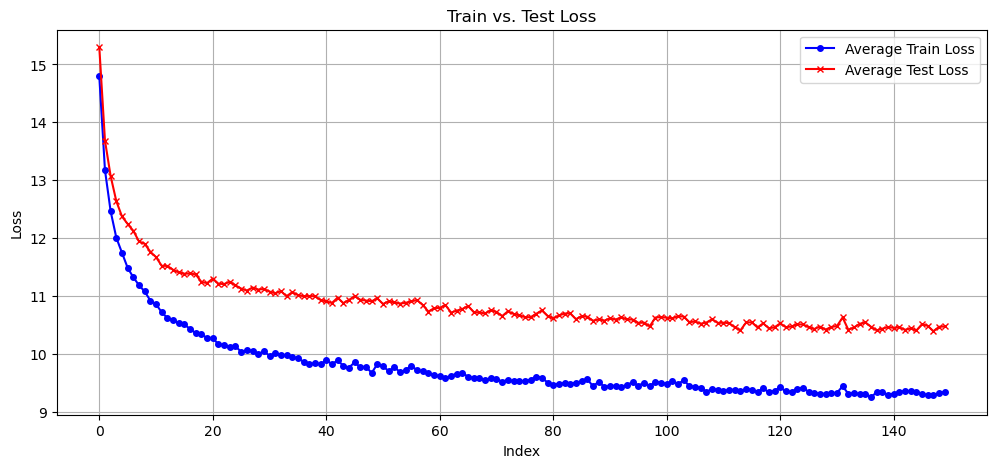

In [25]:
plot_losses(avg_train_losses,avg_test_losses)

# Visualization of stress trained model

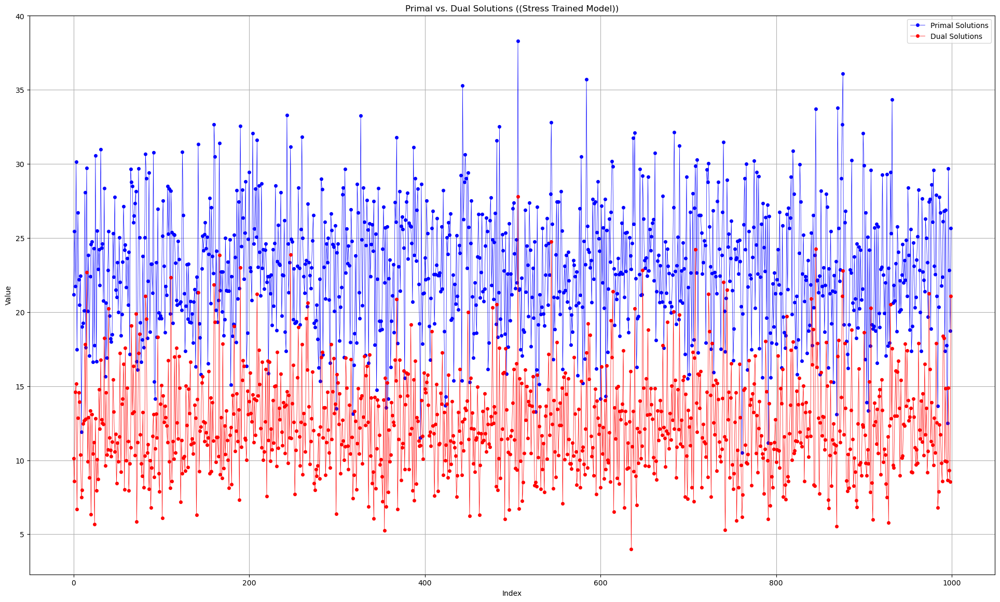

In [26]:
# Set up lists to hold primal and dual solutions
primal_solutions = []
dual_solutions = []
model.eval()  # Set the model to evaluation mode
with torch.no_grad():  # Disable gradient computation for efficiency
    for batch in test_loader:
        sets = batch[0].to(device)

        # Get batched primal and dual solutions
        sets_results = model.predict_interval(sets)
            
        # Separate primal and dual solutions
        for sol_prim, sol_dual in sets_results:
            primal_solutions.append(sol_prim.item())  # Assuming sol_prim is a tensor
            dual_solutions.append(sol_dual.item())    # Assuming sol_dual is a tensor

        # # Since we are breaking after the first batch, we can exit the loop here
        # break  # Remove this line if you want to process more batches

# Convert to numpy arrays for easier plotting
primal_solutions = np.array(primal_solutions)
dual_solutions = np.array(dual_solutions)

# Plotting the results
plt.figure(figsize=(24, 14))

# Plot primal solutions in blue
plt.plot(primal_solutions, label='Primal Solutions', color='blue', marker='o', linestyle='-',linewidth = 0.5,markersize = 4)

# Plot dual solutions in red
plt.plot(dual_solutions, label='Dual Solutions', color='red', marker='o', linestyle='-',linewidth = 0.5,markersize = 4)

plt.title('Primal vs. Dual Solutions ((Stress Trained Model))')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid(True)
plt.legend()
plt.show()

In [27]:
validity_array = np.array(primal_solutions) > np.array(dual_solutions)
if(False in validity_array):
    print("There is a problem")
else:
    print("Seems to work")

Seems to work


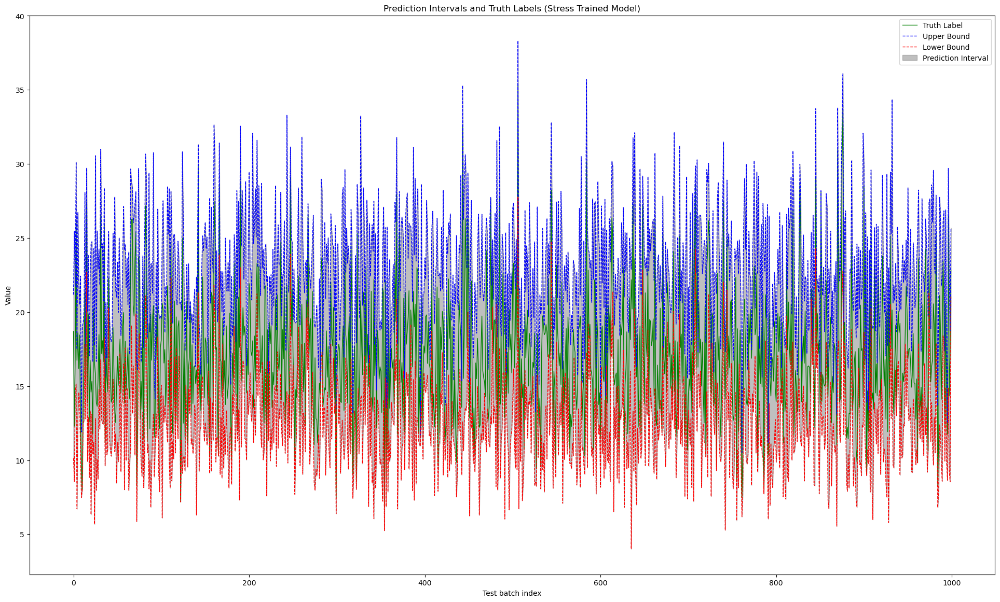

In [28]:
preds = [(dual,primal) for dual,primal in zip(dual_solutions,primal_solutions)]
x = range(len(test_batches))  # x-axis values (can be indices or actual values)
primal_bounds = [pred[1] for pred in preds]
dual_bounds = [pred[0] for pred in preds]
true_label = [wass_hungarian(input).cpu() for input in test_batches]         # True label (ground truth)

# Plotting
plt.figure(figsize=(24, 14))
plt.plot(x, true_label, label='Truth Label', color='green', linewidth=1)
plt.plot(x, primal_bounds, label='Upper Bound', color='blue', linestyle='--', linewidth=1)
plt.plot(x, dual_bounds, label='Lower Bound', color='red', linestyle='--', linewidth=1)

# Shading the area between the lower and upper bounds
plt.fill_between(x, dual_bounds, primal_bounds, color='gray', alpha=0.5, label='Prediction Interval')

# Labels and legend
plt.xlabel('Test batch index')
plt.ylabel('Value')
plt.title('Prediction Intervals and Truth Labels (Stress Trained Model)')
plt.legend()

# Show the plot
plt.show()



# Trying a Different Architecture, O(n²log(n)d) time
* Same parameters first, then larger n

In [29]:
class Logarithmic_Wasser_NN(nn.Module):
    def __init__(self, n: int, d: int):
        super().__init__()
        self.n = n
        self.d = d
        self.flatten = nn.Flatten()
        hidden_size = math.ceil(math.log2(2*n)) * d *2
        self.linear_relu_stack = nn.Sequential(OrderedDict([
            ('Lin1', nn.Linear(2 * n * d, hidden_size)),
            ('relu1', nn.ReLU()),
            ('Lin2', nn.Linear(hidden_size, n * n + 2 * n))  # n x n matrix and two n-long vectors
        ]))

    def forward(self, batch):
        # Reshape batch to (batch_size, 2 * n * d) for the Linear layer
        batch_size = batch.size(0)
        flattened_batch = batch.view(batch_size, 2 * self.n * self.d)  # (batch_size, 2 * n * d)
        
        # Pass through the sequential layers
        logits = self.linear_relu_stack(flattened_batch)
        return logits
    def predict_interval(self, batch):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        # Forward pass to get predictions
        pred = self.forward(batch)  # Now expects batched output of shape (batch_size, n * n + 2 * n)
        batch_size = pred.size(0)
        
        results = []
        for i in range(batch_size):
            # Compute distance matrix for the i-th element in the batch
            distances_mat = torch.cdist(vecs1[i], vecs2[i], p=2)  # Shape: (n, n)
    
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            out_put_mat = single_pred[:n * n].view(n, n)  # Shape: (n, n)
            f = single_pred[n * n:n * n + n]              # Shape: (n,)
            g = single_pred[n * n + n:]                   # Shape: (n,)
    
            # Compute primal and dual solutions
            sol_prim = primal_sol(out_put_mat=out_put_mat, distances_mat=distances_mat)
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)
            
            # Append the result (sol_prim, sol_dual) for each batch element
            results.append((sol_prim, sol_dual))
        
        return results  # Returns a list of tuples, each containing (sol_prim, sol_dual) for a batch element


# Defining Training And Evaluation Process frunction

In [30]:
def train_and_evaluate(model_class,train_loader,test_loader, count, d, n, device, coords_max, batch_size, lr, epochs, seed):
    """
    Train and evaluate a model.

    Parameters:
    - model_class: The model class to be instantiated.
    - count: The number of samples.
    - d: Dimensionality of the data.
    - n: Number of data points.
    - device: The device to run the model on (e.g., 'cuda' or 'cpu').
    - coords_max: Maximum coordinate value for the data generation.
    - batch_size: Batch size for training and testing.
    - lr: Learning rate for the optimizer.
    - epochs: Number of training epochs.
    - seed: Random seed for reproducibility.

    Returns:
    - A list of average test losses per epoch.
    """

    # Initialize model, loss, and optimizer
    model = model_class(n=n, d=d).to(device)
    loss_fn = make_wass_loss(n=n, d=d)
    optimizer = torch.optim.SGD(model.parameters(), lr=lr,momentum=0.95,nesterov=True)

    avg_test_losses = []
    avg_train_losses = []
    # Training and testing loop
    for t in range(epochs):
        print(f"Epoch {t + 1}\n-------------------------------")
        start_time = time.time()
        # Training
        train_model(model, train_loader, loss_fn, optimizer)
        # Testing
        avg_test_losses.append(test_model(model, test_loader, loss_fn))
        avg_train_losses.append(test_model(model, train_loader, loss_fn))
        print(f"Average Train Loss: {avg_train_losses[-1]:.4f}, Average Test Loss: {avg_test_losses[-1]:.4f}")
        end_time = time.time()
        epoch_duration = end_time - start_time
        print(f"Epoch Run time: {epoch_duration:.2f} seconds.\n")
        print("-------------------------------")
    
    print("Done!")
    
    # Return the list of average test losses
    return model,avg_train_losses,avg_test_losses


In [31]:
# Define parameters
count = 5000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-2
batch_size = 64
epochs = 150
# Generate train/test split
train_batches, test_batches = generate_train_test_split(
    count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed
)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

In [32]:
model,avg_train_losses,avg_test_losses = train_and_evaluate(
    model_class=Logarithmic_Wasser_NN,
    train_loader = train_loader,
    test_loader=test_loader,
    count=count,
    d=d,
    n=n,
    device=device,
    coords_max=coords_max,
    batch_size=batch_size,
    lr=lr,
    epochs=epochs,
    seed=seed
)

Epoch 1
-------------------------------
Average Train Loss: 15.3105, Average Test Loss: 15.7544
Epoch Run time: 7.35 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 14.2981, Average Test Loss: 14.8835
Epoch Run time: 7.28 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 13.8513, Average Test Loss: 14.3653
Epoch Run time: 7.22 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 13.5720, Average Test Loss: 14.1652
Epoch Run time: 7.25 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 13.4044, Average Test Loss: 13.9953
Epoch Run time: 7.28 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 13.1950, Average Test Loss: 13.8822
Epoch Run time: 7.44 seconds.

-------------------------------
Epoch 7
-------------------------------
Averag

# Saving and loading model

In [33]:
model_path = "Trained_models/Logarithmic_net_150_ep_5000_data.pt"

In [34]:
torch.save(model.state_dict(), model_path)

In [35]:
# Loading the model
model = Logarithmic_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


# Plotting losses

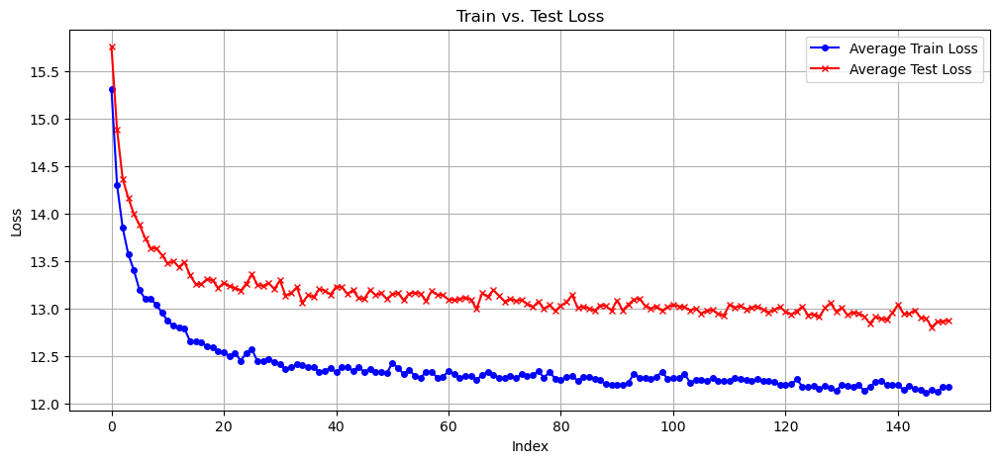

In [36]:
plot_losses(avg_train_losses,avg_test_losses)

# Visualization function

In [38]:
def plot_combined_prediction_intervals(model, test_loader, test_batches, device, plot_title):
    """
    Plots the prediction intervals (primal and dual solutions) alongside the ground truth for a given model.
    Displays three subplots:
    - Unsorted data
    - Data sorted by primal-dual difference
    - Data sorted by dual solutions
    
    Parameters:
    - model: Trained model used for predictions.
    - test_loader: DataLoader containing the test data.
    - test_batches: Original test data (list or tensor), used for the ground truth comparison.
    - wass_hungarian: Function to compute the ground truth label.
    - device: Device to perform computations on (e.g., 'cuda' or 'cpu').
    - plot_title: Title for the entire plot.
    """
    
    # Lists to hold primal and dual solutions
    primal_solutions = []
    dual_solutions = []
    
    # Set model to evaluation mode and disable gradients
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            sets = batch[0].to(device)

            # Get batched primal and dual solutions from model predictions
            sets_results = model.predict_interval(sets)
            
            # Separate primal and dual solutions
            for sol_prim, sol_dual in sets_results:
                primal_solutions.append(sol_prim.item())
                dual_solutions.append(sol_dual.item())

    # Convert solutions to numpy arrays for plotting
    primal_solutions = np.array(primal_solutions)
    dual_solutions = np.array(dual_solutions)

    # Validity check
    if not all(primal_solutions > dual_solutions):
        print("There is a problem: some primal solutions are not greater than dual solutions.")
    else:
        print("Solutions seem valid.")

    # Calculate primal-dual differences
    primal_dual_diff = primal_solutions - dual_solutions
    
    # Sort indices for each of the three plots
    unsorted_indices = np.arange(len(test_batches))
    sorted_by_difference_indices = np.argsort(primal_dual_diff)
    sorted_by_dual_indices = np.argsort(dual_solutions)
    
    # Prepare sorted and unsorted data for plotting
    primal_unsorted = primal_solutions[unsorted_indices]
    dual_unsorted = dual_solutions[unsorted_indices]
    true_label_unsorted = [wass_hungarian(test_batches[i]).cpu().item() for i in unsorted_indices]

    primal_sorted_diff = primal_solutions[sorted_by_difference_indices]
    dual_sorted_diff = dual_solutions[sorted_by_difference_indices]
    true_label_sorted_diff = [wass_hungarian(test_batches[i]).cpu().item() for i in sorted_by_difference_indices]

    primal_sorted_dual = primal_solutions[sorted_by_dual_indices]
    dual_sorted_dual = dual_solutions[sorted_by_dual_indices]
    true_label_sorted_dual = [wass_hungarian(test_batches[i]).cpu().item() for i in sorted_by_dual_indices]
    
    # Set up the figure with vertical subplots
    fig, axs = plt.subplots(3, 1, figsize=(20, 20))
    x = range(len(test_batches))


    # Visual Parameters:
    TITLE_FONT_SIZE = 20
    # Plot 1: Unsorted
    axs[0].plot(x, true_label_unsorted, label='Truth Label', color='green', linewidth=1)
    axs[0].plot(x, primal_unsorted, label='Upper Bound', color='blue', linestyle='--', linewidth=1)
    axs[0].plot(x, dual_unsorted, label='Lower Bound', color='red', linestyle='--', linewidth=1)
    axs[0].fill_between(x, dual_unsorted, primal_unsorted, color='gray', alpha=0.5, label='Prediction Interval')
    axs[0].set_title('Unsorted',fontsize=TITLE_FONT_SIZE)
    axs[0].set_xlabel('Test batch index')
    axs[0].set_ylabel('Value')

    # Plot 2: Sorted by Primal-Dual Difference
    axs[1].plot(x, true_label_sorted_diff, label='Truth Label', color='green', linewidth=1)
    axs[1].plot(x, primal_sorted_diff, label='Upper Bound', color='blue', linestyle='--', linewidth=1)
    axs[1].plot(x, dual_sorted_diff, label='Lower Bound', color='red', linestyle='--', linewidth=1)
    axs[1].fill_between(x, dual_sorted_diff, primal_sorted_diff, color='gray', alpha=0.5, label='Prediction Interval')
    axs[1].set_title('Sorted by Primal-Dual Difference',fontsize=TITLE_FONT_SIZE)
    axs[1].set_xlabel('Sorted Test batch index')

    # Plot 3: Sorted by Dual Solution
    axs[2].plot(x, true_label_sorted_dual, label='Truth Label', color='green', linewidth=1)
    axs[2].plot(x, primal_sorted_dual, label='Upper Bound', color='blue', linestyle='--', linewidth=1)
    axs[2].plot(x, dual_sorted_dual, label='Lower Bound', color='red', linestyle='--', linewidth=1)
    axs[2].fill_between(x, dual_sorted_dual, primal_sorted_dual, color='gray', alpha=0.5, label='Prediction Interval')
    axs[2].set_title('Sorted by Dual Solution',fontsize=TITLE_FONT_SIZE)
    axs[2].set_xlabel('Sorted Test batch index')
    
    # Overall legend and title
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=4)
    fig.suptitle(plot_title,fontsize=TITLE_FONT_SIZE)
    
    # Show the plot
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


Solutions seem valid.


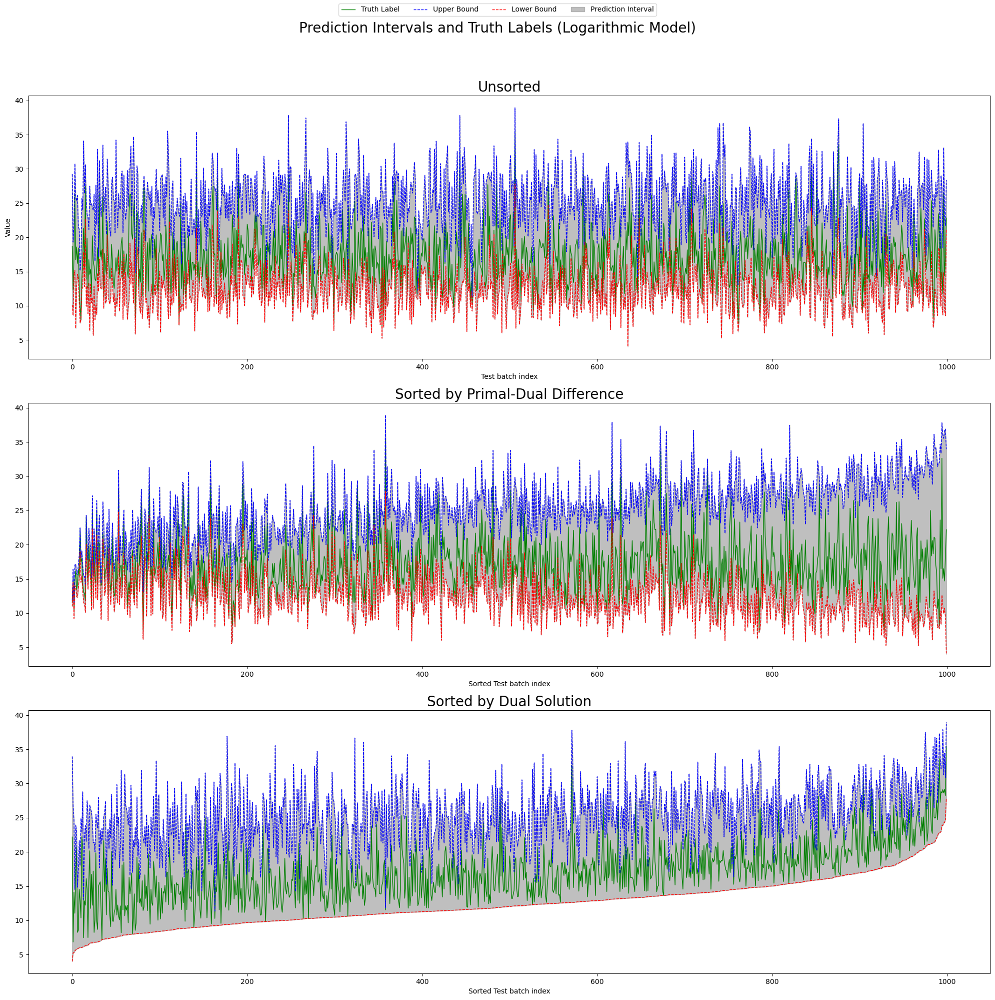

In [39]:
plot_combined_prediction_intervals(
    model=model,
    test_loader=test_loader,
    test_batches=test_batches,
    device=device,
    plot_title="Prediction Intervals and Truth Labels (Logarithmic Model)"
)

# Translation Invariant Networks
* Normalizing the center of the generated sets of inputs before forwarding should make a network that is translation invariant
* Apparently reduces overfitting slightly

In [40]:
class Translation_inv_Base_Wasser_NN(nn.Module):
    def __init__(self, n: int, d: int):
        super().__init__()
        self.n = n
        self.d = d
        self.flatten = nn.Flatten()
        hidden_size = 4*n*d
        self.linear_relu_stack = nn.Sequential(OrderedDict([
            ('Lin1', nn.Linear(2 * n * d, hidden_size)),
            ('relu1', nn.ReLU()),
            ('Lin2', nn.Linear(hidden_size, n * n + 2 * n))  # n x n matrix and two n-long vectors
        ]))

    def forward(self, batch):
        # Step 2: Compute mean of each tuple along the dimension with the two vectors
        mean_vector = batch[0].mean(dim=2, keepdim=True)  # (batch_size, n, 1, d)
        # Reshape batch to (batch_size, 2 * n * d) for the Linear layer
        batch_normalized = batch - mean_vector
        batch_size = batch.size(0)
        flattened_batch = batch_normalized.view(batch_size, 2 * self.n * self.d)  # (batch_size, 2 * n * d)
        
        # Pass through the sequential layers
        logits = self.linear_relu_stack(flattened_batch)
        return logits
    def predict_interval(self, batch):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        # Forward pass to get predictions
        pred = self.forward(batch)  # Now expects batched output of shape (batch_size, n * n + 2 * n)
        batch_size = pred.size(0)
        
        results = []
        for i in range(batch_size):
            # Compute distance matrix for the i-th element in the batch
            distances_mat = torch.cdist(vecs1[i], vecs2[i], p=2)  # Shape: (n, n)
    
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            out_put_mat = single_pred[:n * n].view(n, n)  # Shape: (n, n)
            f = single_pred[n * n:n * n + n]              # Shape: (n,)
            g = single_pred[n * n + n:]                   # Shape: (n,)
    
            # Compute primal and dual solutions
            sol_prim = primal_sol(out_put_mat=out_put_mat, distances_mat=distances_mat)
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)
            
            # Append the result (sol_prim, sol_dual) for each batch element
            results.append((sol_prim, sol_dual))
        
        return results  # Returns a list of tuples, each containing (sol_prim, sol_dual) for a batch element


In [41]:
# Define parameters
count = 5000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-2
batch_size = 64
epochs = 150
# Generate train/test split
train_batches, test_batches = generate_train_test_split(
    count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed
)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

In [42]:
model,avg_train_losses,avg_test_losses = train_and_evaluate(
    model_class=Translation_inv_Base_Wasser_NN,
    train_loader = train_loader,
    test_loader=test_loader,
    count=count,
    d=d,
    n=n,
    device=device,
    coords_max=coords_max,
    batch_size=batch_size,
    lr=lr,
    epochs=epochs,
    seed=seed
)

Epoch 1
-------------------------------
Average Train Loss: 15.9507, Average Test Loss: 16.1889
Epoch Run time: 8.15 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 14.8636, Average Test Loss: 15.2364
Epoch Run time: 8.15 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 14.5480, Average Test Loss: 14.8508
Epoch Run time: 8.38 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 14.1573, Average Test Loss: 14.5694
Epoch Run time: 8.31 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 13.9583, Average Test Loss: 14.3475
Epoch Run time: 8.05 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 13.7952, Average Test Loss: 14.1566
Epoch Run time: 8.17 seconds.

-------------------------------
Epoch 7
-------------------------------
Averag

# Saving and loading model

In [43]:
model_path = "Trained_models/Translation_inv_Basic_net_150_ep_5000_data.pt"

In [44]:
torch.save(model.state_dict(), model_path)

In [45]:
# Loading the model
model = Translation_inv_Base_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


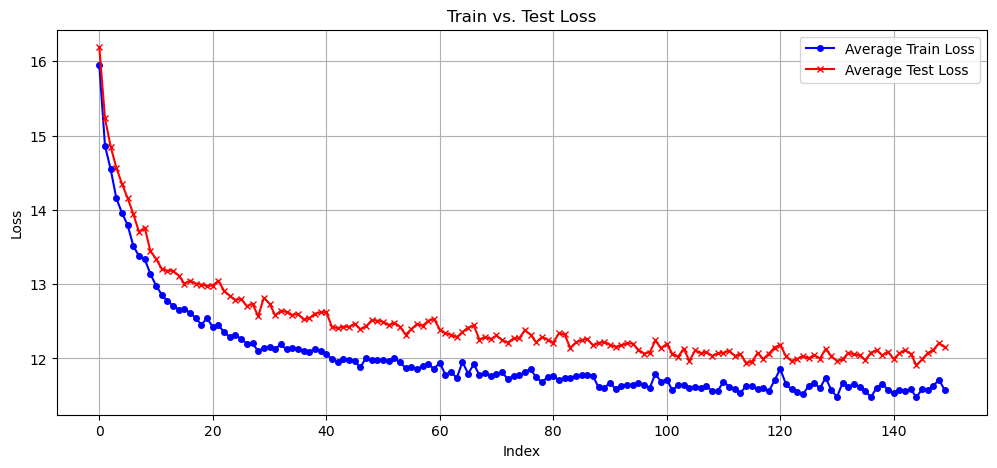

In [46]:
plot_losses(avg_train_losses,avg_test_losses)

There is a problem: some primal solutions are not greater than dual solutions.


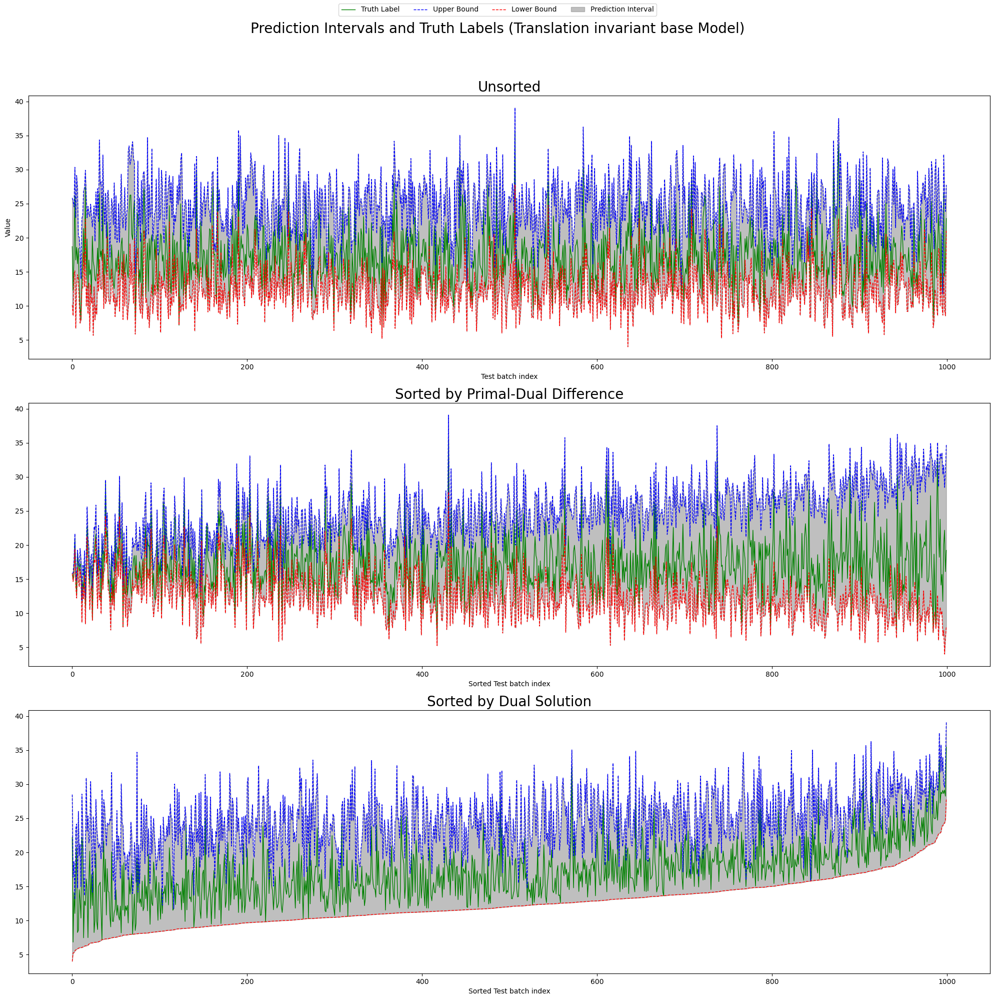

In [47]:
plot_combined_prediction_intervals(
    model=model,
    test_loader=test_loader,
    test_batches=test_batches,
    device=device,
    plot_title="Prediction Intervals and Truth Labels (Translation invariant base Model)"
)

# Translation invariant logarithmic network

In [48]:
class Translation_inv_logarithmic_Wasser_NN(nn.Module):
    def __init__(self, n: int, d: int):
        super().__init__()
        self.n = n
        self.d = d
        self.flatten = nn.Flatten()
        hidden_size = math.ceil(math.log2(2*n)) * d *2
        self.linear_relu_stack = nn.Sequential(OrderedDict([
            ('Lin1', nn.Linear(2 * n * d, hidden_size)),
            ('relu1', nn.ReLU()),
            ('Lin2', nn.Linear(hidden_size, n * n + 2 * n))  # n x n matrix and two n-long vectors
        ]))

    def forward(self, batch):
        # Step 2: Compute mean of each tuple along the dimension with the two vectors
        mean_vector = batch[0].mean(dim=2, keepdim=True)  # (batch_size, n, 1, d)
        # Reshape batch to (batch_size, 2 * n * d) for the Linear layer
        batch_normalized = batch - mean_vector
        batch_size = batch.size(0)
        flattened_batch = batch_normalized.view(batch_size, 2 * self.n * self.d)  # (batch_size, 2 * n * d)
        
        # Pass through the sequential layers
        logits = self.linear_relu_stack(flattened_batch)
        return logits
    def predict_interval(self, batch):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        # Forward pass to get predictions
        pred = self.forward(batch)  # Now expects batched output of shape (batch_size, n * n + 2 * n)
        batch_size = pred.size(0)
        
        results = []
        for i in range(batch_size):
            # Compute distance matrix for the i-th element in the batch
            distances_mat = torch.cdist(vecs1[i], vecs2[i], p=2)  # Shape: (n, n)
    
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            out_put_mat = single_pred[:n * n].view(n, n)  # Shape: (n, n)
            f = single_pred[n * n:n * n + n]              # Shape: (n,)
            g = single_pred[n * n + n:]                   # Shape: (n,)
    
            # Compute primal and dual solutions
            sol_prim = primal_sol(out_put_mat=out_put_mat, distances_mat=distances_mat)
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)
            
            # Append the result (sol_prim, sol_dual) for each batch element
            results.append((sol_prim, sol_dual))
        
        return results  # Returns a list of tuples, each containing (sol_prim, sol_dual) for a batch element


In [49]:
# Define parameters
count = 5000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-2
batch_size = 64
epochs = 150
# Generate train/test split
train_batches, test_batches = generate_train_test_split(
    count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed
)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

In [50]:
model,avg_train_losses,avg_test_losses = train_and_evaluate(
    model_class=Translation_inv_logarithmic_Wasser_NN,
    train_loader = train_loader,
    test_loader=test_loader,
    count=count,
    d=d,
    n=n,
    device=device,
    coords_max=coords_max,
    batch_size=batch_size,
    lr=lr,
    epochs=epochs,
    seed=seed
)

Epoch 1
-------------------------------
Average Train Loss: 16.6277, Average Test Loss: 16.8145
Epoch Run time: 7.43 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 15.3472, Average Test Loss: 15.5426
Epoch Run time: 7.52 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 15.0929, Average Test Loss: 15.4190
Epoch Run time: 7.54 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 14.9695, Average Test Loss: 15.2005
Epoch Run time: 7.67 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 14.8537, Average Test Loss: 15.1263
Epoch Run time: 7.29 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 14.7481, Average Test Loss: 15.1183
Epoch Run time: 7.18 seconds.

-------------------------------
Epoch 7
-------------------------------
Averag

# Saving and loading model

In [51]:
model_path = "Trained_models/Translation_inv_logarithmic_net_150_ep_5000_data.pt"

In [52]:
torch.save(model.state_dict(), model_path)

In [53]:
# Loading the model
model = Translation_inv_logarithmic_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


# Plotting losses 

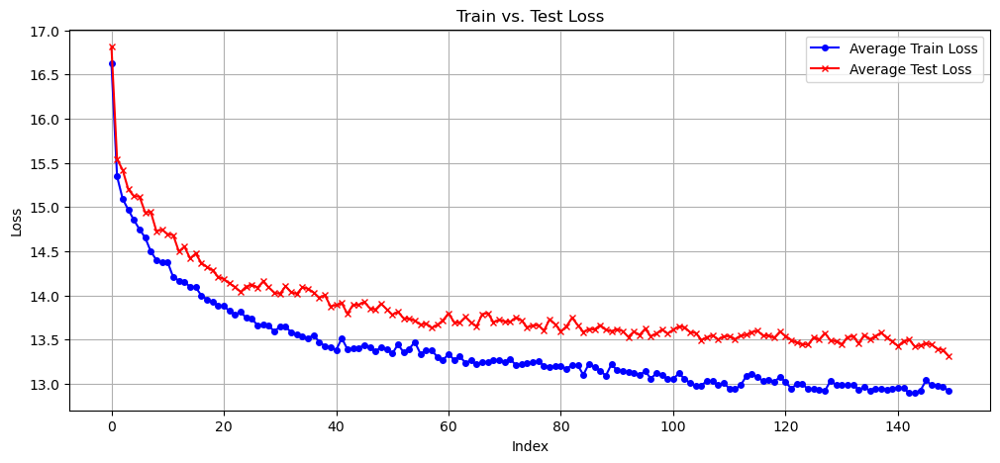

In [54]:
plot_losses(avg_train_losses,avg_test_losses)

Solutions seem valid.


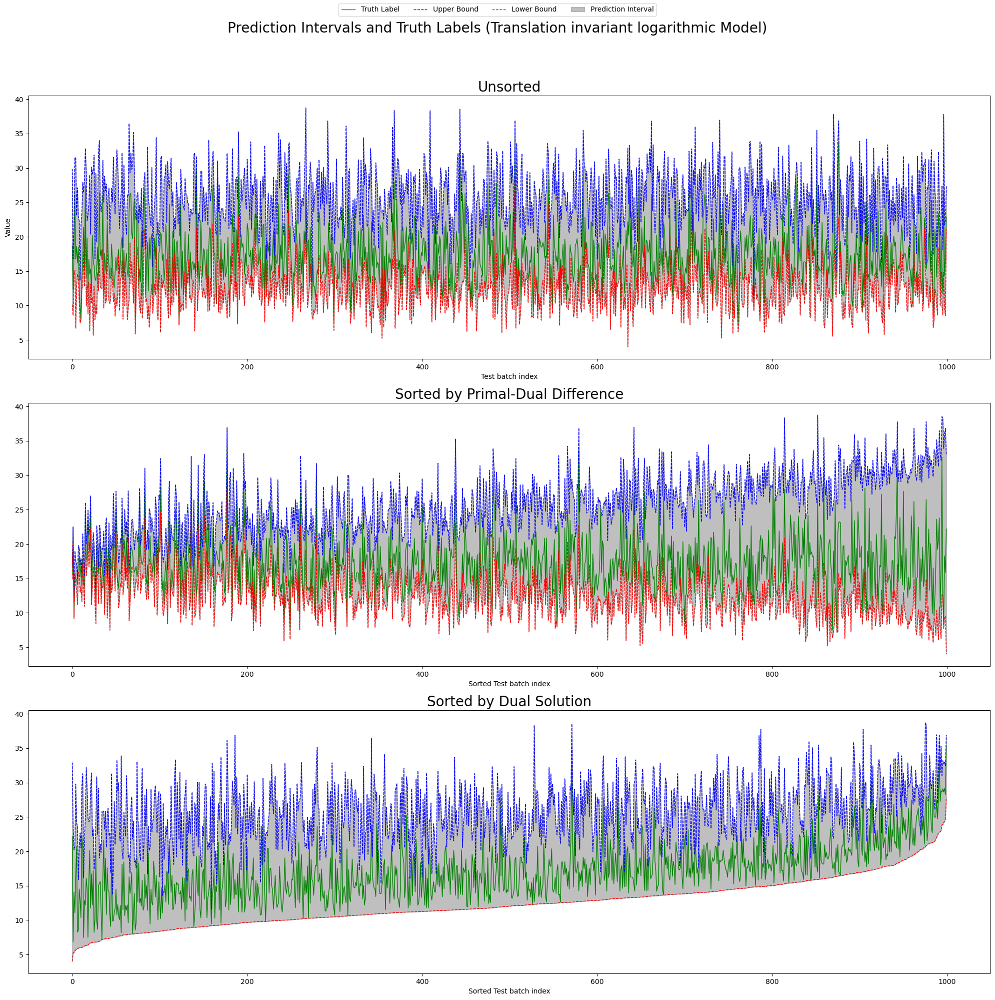

In [55]:
plot_combined_prediction_intervals(
    model=model,
    test_loader=test_loader,
    test_batches=test_batches,
    device=device,
    plot_title="Prediction Intervals and Truth Labels (Translation invariant logarithmic Model)"
)

# Dual Bound Network

In [428]:
class Dual_Base_Wasser_NN(nn.Module):
    def __init__(self, n: int, d: int):
        super().__init__()
        self.n = n
        self.d = d
        self.flatten = nn.Flatten()
        hidden_size = 4*n*d
        activation = nn.ReLU()
        self.linear_relu_stack = nn.Sequential(OrderedDict([
            ('Lin1', nn.Linear(2 * n * d, hidden_size)),
            ('relu1', activation),
            ('Lin2', nn.Linear(hidden_size, hidden_size)),
            ('relu2', activation),
            ('Lin3', nn.Linear(hidden_size, hidden_size)),
            ('relu3', activation),
            ('Lin4', nn.Linear(hidden_size,2 * n))  # two n-long vectors, no matrix!
        ]))

    def forward(self, batch):
        batch_size = batch.size(0)
        flattened_batch = batch.view(batch_size, 2 * self.n * self.d)  # (batch_size, 2 * n * d)
        
        # Pass through the sequential layers
        logits = self.linear_relu_stack(flattened_batch)
        return logits
    def predict(self, batch):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        # Forward pass to get predictions
        pred = self.forward(batch)  # Now expects batched output of shape (batch_size, n * n + 2 * n)
        batch_size = pred.size(0)
        
        results = []
        for i in range(batch_size):
            # Compute distance matrix for the i-th element in the batch
            distances_mat = torch.cdist(vecs1[i], vecs2[i], p=2)  # Shape: (n, n)
    
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            f = single_pred[:n]              # Shape: (n,)
            g = single_pred[n:]              # Shape: (n,)
    
            # Compute  dual solution
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)

            results.append(sol_dual)
        
        return results  # Returns a list of tuples, each containing (sol_prim, sol_dual) for a batch element


## Defining new loss

In [429]:
def make_dual_wass_loss(n: int, d: int):
    def dual_wass_loss(batch, pred):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        batch_size = pred.size(0)  # Determine batch size from pred

        # Compute distance matrix for each item in the batch
        total_loss = 0
        for i in range(batch_size):
            distances_mat = torch.cdist(vecs1[i], vecs2[i])  # Shape: (n, n)
            
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            f = single_pred[:n]              # Shape: (n,)
            g = single_pred[n:]              # Shape: (n,)
            
            # Compute dual solution
            sol_dual = dual_sol(f=f, g=g, distances_mat=distances_mat)

            if torch.isnan(sol_dual).any():
                print(f"NaN detected in sol_dual {i}")

            # Accumulate loss
            total_loss += wass_hungarian((batch[i]))-sol_dual # THIS NEEDS TO BE MINIMIZED

        # Return average loss across the batch
        return total_loss / batch_size

    return dual_wass_loss


## Define Training function

In [465]:
def train_and_evaluate_dual(model_class,loss_maker,train_loader,test_loader, count, d, n, device, batch_size, lr, epochs):
    """
    Train and evaluate a model.

    Parameters:
    - model_class: The model class to be instantiated.
    - count: The number of samples.
    - d: Dimensionality of the data.
    - n: Number of data points.
    - device: The device to run the model on (e.g., 'cuda' or 'cpu').
    - coords_max: Maximum coordinate value for the data generation.
    - batch_size: Batch size for training and testing.
    - lr: Learning rate for the optimizer.
    - epochs: Number of training epochs.
    - seed: Random seed for reproducibility.

    Returns:
    - A list of average test losses per epoch.
    """

    # Initialize model, loss, and optimizer
    model = model_class(n=n, d=d).to(device)
    loss_fn = loss_maker(n=n, d=d)
    optimizer = torch.optim.SGD(model.parameters(), lr=lr,momentum=0.95,nesterov=True)
    avg_test_losses = []
    avg_train_losses = []
    # Training and testing loop
    for t in range(epochs):
        print(f"Epoch {t + 1}\n-------------------------------")
        start_time = time.time()
        # Training
        train_model(model, train_loader, loss_fn, optimizer)
        # Testing
        avg_test_losses.append(test_model(model, test_loader, loss_fn))
        avg_train_losses.append(test_model(model, train_loader, loss_fn))
        print(f"Average Train Loss: {avg_train_losses[-1]:.4f}, Average Test Loss: {avg_test_losses[-1]:.4f}")
        end_time = time.time()
        epoch_duration = end_time - start_time
        print(f"Epoch Run time: {epoch_duration:.2f} seconds.\n")
        print("-------------------------------")
    
    print("Done!")
    
    # Return the list of average test losses
    return model,avg_train_losses,avg_test_losses


In [484]:
# Define parameters
count = 12000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-4
batch_size = 64
epochs = 20
# Generate train/test split
train_batches, test_batches = generate_train_test_split(
    count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed
)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)
Dual_Base_Wasser_NN(n=n,d=d)

Dual_Base_Wasser_NN(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (Lin1): Linear(in_features=24, out_features=48, bias=True)
    (relu1): ReLU()
    (Lin2): Linear(in_features=48, out_features=48, bias=True)
    (relu2): ReLU()
    (Lin3): Linear(in_features=48, out_features=48, bias=True)
    (relu3): ReLU()
    (Lin4): Linear(in_features=48, out_features=12, bias=True)
  )
)

In [485]:
model,avg_train_losses,avg_test_losses = train_and_evaluate_dual(
    model_class=Dual_Base_Wasser_NN,
    loss_maker = make_dual_wass_loss,
    train_loader = train_loader,
    test_loader=test_loader,
    count=count,
    d=d,
    n=n,
    device=device,
    batch_size=batch_size,
    lr=lr,
    epochs=epochs
)

Epoch 1
-------------------------------
Average Train Loss: 14.6546, Average Test Loss: 14.6332
Epoch Run time: 6.78 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 12.4539, Average Test Loss: 12.4189
Epoch Run time: 6.54 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 10.1083, Average Test Loss: 10.0574
Epoch Run time: 6.40 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 7.9992, Average Test Loss: 7.9457
Epoch Run time: 6.65 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 6.4264, Average Test Loss: 6.3828
Epoch Run time: 6.45 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 5.4999, Average Test Loss: 5.4644
Epoch Run time: 6.47 seconds.

-------------------------------
Epoch 7
-------------------------------
Average Trai

# Saving and loading model

In [486]:
model_path = "Trained_models/Dual_base_net_20_ep_12000_data.pt"

In [487]:
torch.save(model.state_dict(), model_path)

In [488]:
# Loading the model
model = Dual_Base_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


# Plotting losses

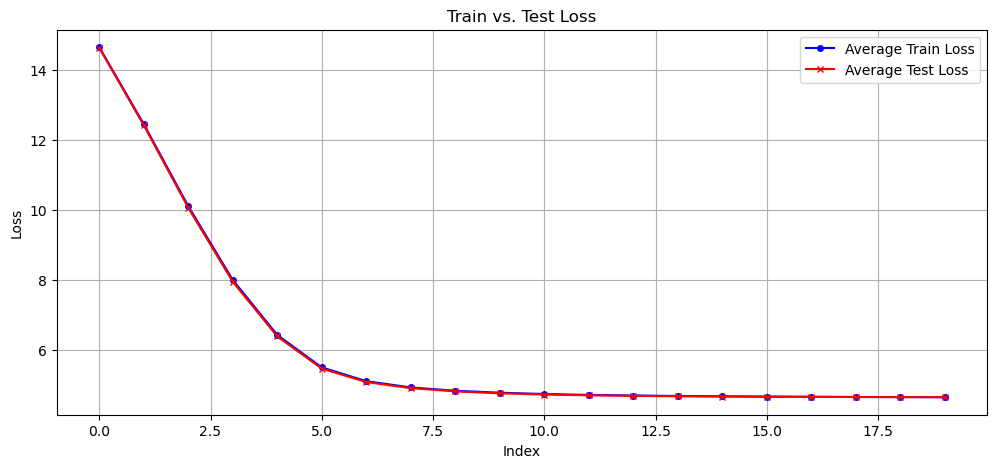

In [489]:
plot_losses(avg_train_losses,avg_test_losses)

* Clear Plateau`

# Plotting parameter distribution

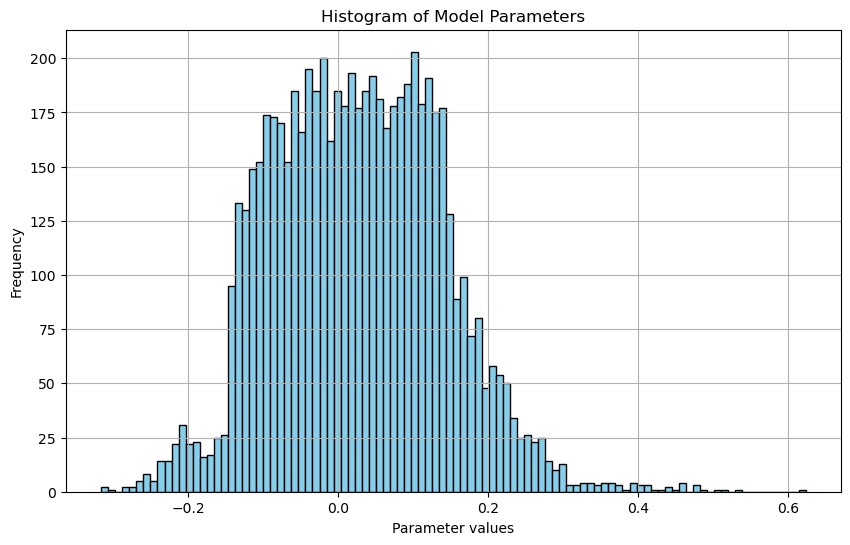

Total number of trainable parameters: 6492
Number of parameters with |value| <= 0.02: 765


In [490]:
plot_model_params(model)

# Plotting Boundaries

In [491]:
def plot_combined_predictions_dual(model, test_loader, test_batches, device, plot_title):
    """
    Plots only the dual solutions alongside the ground truth for a given model.
    Displays three subplots:
    - Unsorted data
    - Data sorted by dual solutions difference
    - Data sorted by dual solutions

    Parameters:
    - model: Trained model used for predictions.
    - test_loader: DataLoader containing the test data.
    - test_batches: Original test data (list or tensor), used for the ground truth comparison.
    - wass_hungarian: Function to compute the ground truth label.
    - device: Device to perform computations on (e.g., 'cuda' or 'cpu').
    - plot_title: Title for the entire plot.
    """
    
    # List to hold dual solutions only
    dual_solutions = []
    
    # Set model to evaluation mode and disable gradients
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            sets = batch[0].to(device)

            # Get batched primal and dual solutions from model predictions
            sets_results = model.predict(sets)
            
            # Only keep dual solutions
            for sol_dual in sets_results:
                dual_solutions.append(sol_dual.item())

    # Convert dual solutions to numpy array for plotting
    dual_solutions = np.array(dual_solutions)

    # Sort indices for each of the three plots
    unsorted_indices = np.arange(len(test_batches))
    sorted_by_dual_indices = np.argsort(dual_solutions)
    
    # Prepare sorted and unsorted data for plotting
    dual_unsorted = dual_solutions[unsorted_indices]
    true_label_unsorted = [wass_hungarian(test_batches[i]).cpu().item() for i in unsorted_indices]

    dual_sorted_dual = dual_solutions[sorted_by_dual_indices]
    true_label_sorted_dual = [wass_hungarian(test_batches[i]).cpu().item() for i in sorted_by_dual_indices]
    
    # Set up the figure with vertical subplots
    fig, axs = plt.subplots(3, 1, figsize=(20, 20))
    x = range(len(test_batches))

    # Visual Parameters:
    TITLE_FONT_SIZE = 20

    # Plot 1: Unsorted
    axs[0].plot(x, true_label_unsorted, label='Truth Label', color='green', linewidth=1)
    axs[0].plot(x, dual_unsorted, label='Dual Solution', color='red', linestyle='--', linewidth=1)
    axs[0].fill_between(x, true_label_unsorted, dual_unsorted, color='grey', alpha=0.3, label='Difference Area')
    axs[0].set_title('Unsorted', fontsize=TITLE_FONT_SIZE)
    axs[0].set_xlabel('Test batch index')
    axs[0].set_ylabel('Value')

    # Plot 2: Sorted by Dual Difference
    axs[1].plot(x, true_label_unsorted, label='Truth Label', color='green', linewidth=1)
    axs[1].plot(x, dual_unsorted, label='Dual Solution', color='red', linestyle='--', linewidth=1)
    axs[1].fill_between(x, true_label_unsorted, dual_unsorted, color='grey', alpha=0.3, label='Difference Area')
    axs[1].set_title('Sorted by Primal-Dual Difference', fontsize=TITLE_FONT_SIZE)
    axs[1].set_xlabel('Sorted Test batch index')

    # Plot 3: Sorted by Dual Solution
    axs[2].plot(x, true_label_sorted_dual, label='Truth Label', color='green', linewidth=1)
    axs[2].plot(x, dual_sorted_dual, label='Dual Solution', color='red', linestyle='--', linewidth=1)
    axs[2].fill_between(x, true_label_sorted_dual, dual_sorted_dual, color='grey', alpha=0.3, label='Difference Area')
    axs[2].set_title('Sorted by Dual Solution', fontsize=TITLE_FONT_SIZE)
    axs[2].set_xlabel('Sorted Test batch index')
    
    # Overall legend and title
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=4)
    fig.suptitle(plot_title, fontsize=TITLE_FONT_SIZE)
    
    # Show the plot
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


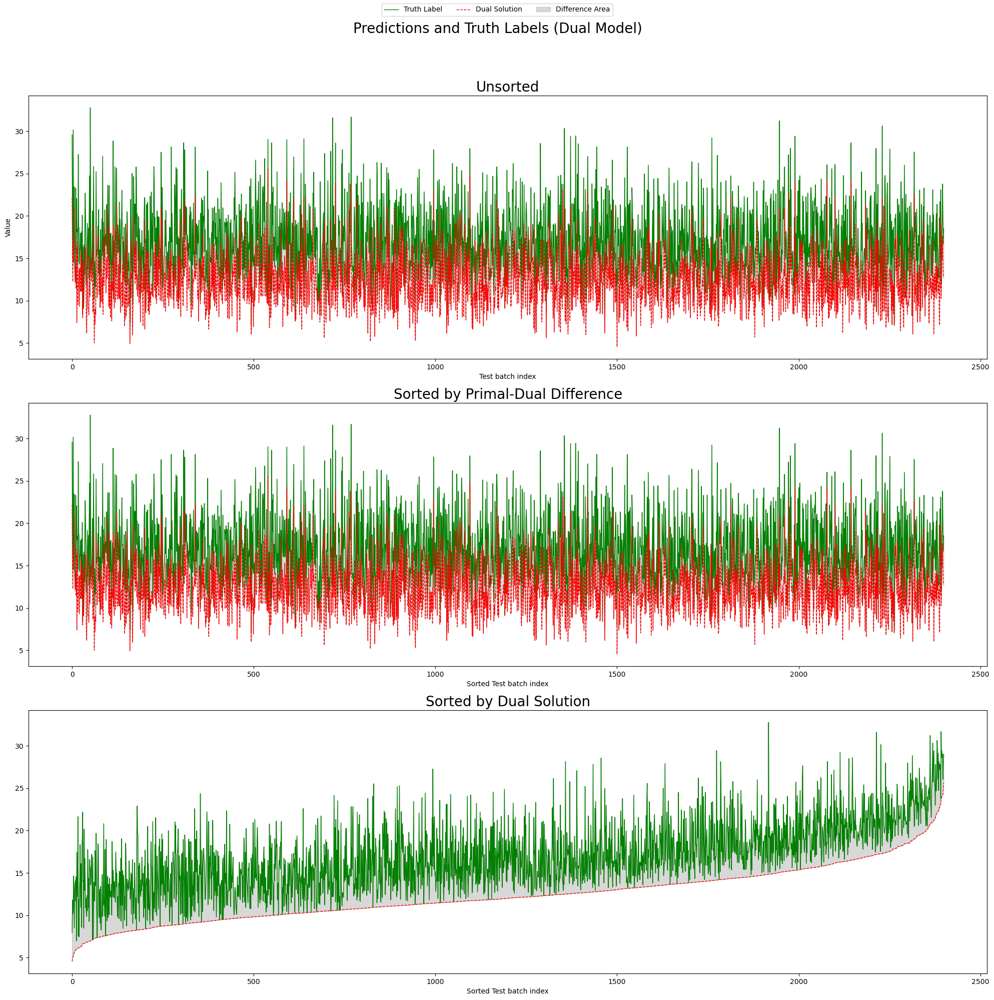

In [492]:
plot_combined_predictions_dual(
    model=model,
    test_loader=test_loader,
    test_batches=test_batches,
    device=device,
    plot_title="Predictions and Truth Labels (Dual Model)"
)

# Trying symmetric dual solution

In [493]:
class Sym_Dual_Base_Wasser_NN(nn.Module):
    def __init__(self, n: int, d: int):
        super().__init__()
        self.n = n
        self.d = d
        self.flatten = nn.Flatten()
        hidden_size = 4*n*d
        activation = nn.ReLU()
        self.linear_relu_stack = nn.Sequential(OrderedDict([
            ('Lin1', nn.Linear(2 * n * d, hidden_size)),
            ('relu1', activation),
            ('Lin2', nn.Linear(hidden_size, hidden_size)),
            ('relu2', activation),
            ('Lin3', nn.Linear(hidden_size, hidden_size)),
            ('relu3', activation),
            ('Lin4', nn.Linear(hidden_size,2 * n))  # two n-long vectors, no matrix!
        ]))

    def forward(self, batch):
        batch_size = batch.size(0)
        flattened_batch = batch.view(batch_size, 2 * self.n * self.d)  # (batch_size, 2 * n * d)
        
        # Pass through the sequential layers
        logits = self.linear_relu_stack(flattened_batch)
        return logits
    def predict(self, batch):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        # Forward pass to get predictions
        pred = self.forward(batch)  # Now expects batched output of shape (batch_size, n * n + 2 * n)
        batch_size = pred.size(0)
        
        results = []
        for i in range(batch_size):
            # Compute distance matrix for the i-th element in the batch
            distances_mat = torch.cdist(vecs1[i], vecs2[i], p=2)  # Shape: (n, n)
    
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            f = single_pred[:n]              # Shape: (n,)
            g = single_pred[n:]              # Shape: (n,)
    
            # Compute  dual solution
            sol_dual = max(dual_sol(f=f, g=g, distances_mat=distances_mat),dual_sol(f=g, g=f, distances_mat=distances_mat))

            results.append(sol_dual)
        
        return results  # Returns a list of tuples, each containing (sol_prim, sol_dual) for a batch element


In [494]:
def make_sym_dual_wass_loss(n: int, d: int):
    def sym_dual_wass_loss(batch, pred):
        # Unpack batched vectors from the input batch
        vecs1 = batch[:, 0, :, :]  # Shape: (batch_size, n, d)
        vecs2 = batch[:, 1, :, :]  # Shape: (batch_size, n, d)

        batch_size = pred.size(0)  # Determine batch size from pred

        # Compute distance matrix for each item in the batch
        total_loss = 0
        for i in range(batch_size):
            distances_mat = torch.cdist(vecs1[i], vecs2[i])  # Shape: (n, n)
            
            # Separate the i-th prediction output into its components
            single_pred = pred[i]
            f = single_pred[:n]              # Shape: (n,)
            g = single_pred[n:]              # Shape: (n,)
            
            # Compute dual solution
            sol_dual = max(dual_sol(f=f, g=g, distances_mat=distances_mat),dual_sol(f=g, g=f, distances_mat=distances_mat))

            if torch.isnan(sol_dual).any():
                print(f"NaN detected in sol_dual {i}")

            # Accumulate loss
            total_loss += wass_hungarian((batch[i]))-sol_dual # THIS NEEDS TO BE MINIMIZED

        # Return average loss across the batch
        return total_loss / batch_size

    return sym_dual_wass_loss


In [495]:
# Define parameters
count = 12000
d = 2
n = 6
seed = 16
device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")
coords_max = 10
lr = 1e-4
batch_size = 64
epochs = 20
# Generate train/test split
train_batches, test_batches = generate_train_test_split(
    count=count, dim=d, n=n, device=device, coord_max=coords_max, test_size=0.2, seed=seed
)

# Create DataLoaders
train_dataset = TensorDataset(train_batches)
test_dataset = TensorDataset(test_batches)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)
Sym_Dual_Base_Wasser_NN(n=n,d=d)

Sym_Dual_Base_Wasser_NN(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (Lin1): Linear(in_features=24, out_features=48, bias=True)
    (relu1): ReLU()
    (Lin2): Linear(in_features=48, out_features=48, bias=True)
    (relu2): ReLU()
    (Lin3): Linear(in_features=48, out_features=48, bias=True)
    (relu3): ReLU()
    (Lin4): Linear(in_features=48, out_features=12, bias=True)
  )
)

In [496]:
model,avg_train_losses,avg_test_losses = train_and_evaluate_dual(
    model_class=Sym_Dual_Base_Wasser_NN,
    loss_maker = make_sym_dual_wass_loss,
    train_loader = train_loader,
    test_loader=test_loader,
    count=count,
    d=d,
    n=n,
    device=device,
    batch_size=batch_size,
    lr=lr,
    epochs=epochs
)

Epoch 1
-------------------------------
Average Train Loss: 14.6546, Average Test Loss: 14.6332
Epoch Run time: 9.07 seconds.

-------------------------------
Epoch 2
-------------------------------
Average Train Loss: 12.4539, Average Test Loss: 12.4189
Epoch Run time: 9.31 seconds.

-------------------------------
Epoch 3
-------------------------------
Average Train Loss: 10.1083, Average Test Loss: 10.0574
Epoch Run time: 8.60 seconds.

-------------------------------
Epoch 4
-------------------------------
Average Train Loss: 7.9992, Average Test Loss: 7.9457
Epoch Run time: 8.95 seconds.

-------------------------------
Epoch 5
-------------------------------
Average Train Loss: 6.4264, Average Test Loss: 6.3828
Epoch Run time: 8.64 seconds.

-------------------------------
Epoch 6
-------------------------------
Average Train Loss: 5.4999, Average Test Loss: 5.4644
Epoch Run time: 8.41 seconds.

-------------------------------
Epoch 7
-------------------------------
Average Trai

# Saving and loading model

In [497]:
model_path = "Trained_models/Sym_Dual_base_net_20_ep_12000_data.pt"

In [498]:
torch.save(model.state_dict(), model_path)

In [499]:
# Loading the model
model = Dual_Base_Wasser_NN(n=n, d=d).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()
print("Model loaded successfully.")

Model loaded successfully.


# Plotting losses

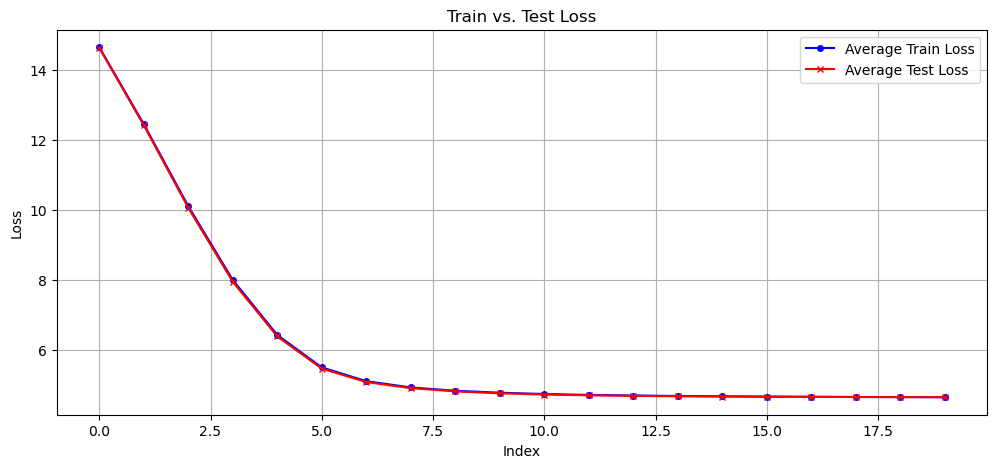

In [500]:
plot_losses(avg_train_losses,avg_test_losses)

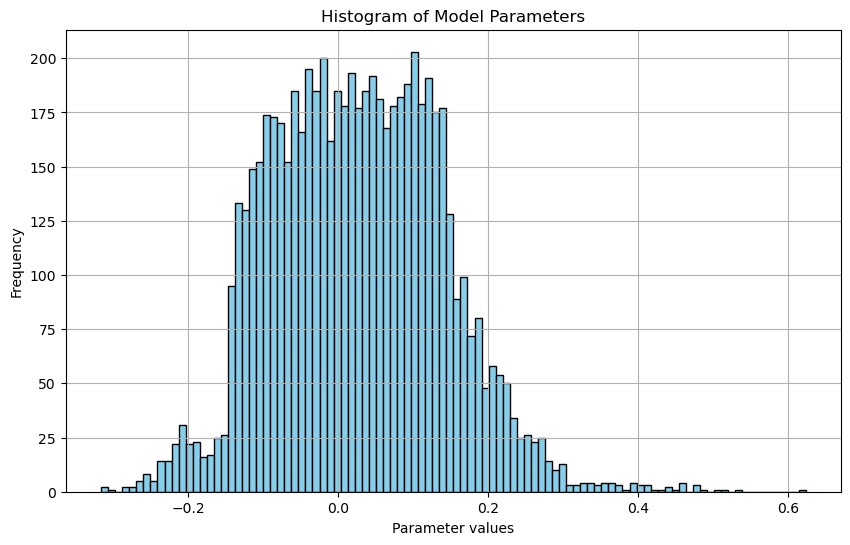

Total number of trainable parameters: 6492
Number of parameters with |value| <= 0.02: 765


In [501]:
plot_model_params(model)